In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
from importlib import reload
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tfl
from sklearn.cluster import KMeans
import cv2
from numba import jit
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error as RMSE

import hsilib as hl
hl = reload(hl)

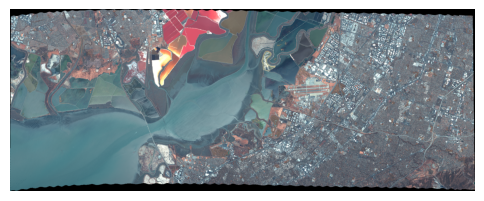

In [3]:
import spectral.io.envi as envi
hsi_path = r'C:\Users\konst\jupyter_notebook\HSI\data envil\moffet\\'
moffett_hsi = envi.open(hsi_path + r'f080611t01p00r07rdn_c_sc01_ort_img.hdr',
                        hsi_path + r'f080611t01p00r07rdn_c_sc01_ort_img')

HSI = np.array(np.rot90(moffett_hsi.open_memmap(writble = True)))

#HSI = HSI[..., :80]
height, width, bands = HSI.shape

color_image = hl.HSI_to_RGB(HSI, (37, 18, 11))
hl.show(color_image)

In [4]:
#IMFs = hl.EMD(HSI, 20)
#np.save("0-3", IMFs[0:4])
#np.save("4-7", IMFs[4:8])
#np.save("8-11", IMFs[8:12])
#np.save("12-15", IMFs[12:16])
#np.save("16-19", IMFs[16:20])

In [4]:
reference_coords = np.array(((540,  470),  #water
                             #(508,  428),  #water
                             (288,  758),  #dirt
                             (154,  834),  #swamps
                             (315, 1334),  #soil
                             (335, 1360),  #vegetable
                             (305, 1280),  #concrete
                             (278,  606),  #salt
                             (18,   811),  #salt_water
                             (365, 1431)), #asphalt
                             dtype = int)

name_reference = ("water", "dirt", "swamps", "soil", "vegetable", "concrete", "salt", "salt_water", "asphalt")

colors_class = np.array(((0.56, 0.56, 1), (0.64, 0.28, 0.64), (0.05, 0.54, 0.13), (0.72, 0.45, 0.2),
                        (0, 0.9, 0), (0.29, 0.29, 0.29), (1, 1, 0), (1, 0, 0), (0, 0, 0)))

In [5]:
first_imfs = np.load("0-3.npy")
last_imfs = np.load("16-19.npy")

In [6]:
first_reference_imf = np.zeros(shape = (first_imfs.shape[0], reference_coords.shape[0], bands))
last_reference_imf  = np.zeros(shape = (last_imfs.shape[0], reference_coords.shape[0], bands))

win_size = 1
for i in range(first_imfs.shape[0]):
    for r in range(reference_coords.shape[0]):
        y_up = reference_coords[r][0] - win_size
        y_dw = reference_coords[r][0] + win_size + 1
        x_lt = reference_coords[r][1] - win_size
        x_rt = reference_coords[r][1] + win_size + 1
        
        first_reference_imf[i, r, :] = first_imfs[i, y_up:y_dw, x_lt:x_rt, :].mean(axis = (0, 1))
                   
                   
for i in range(last_imfs.shape[0]):
    for r in range(reference_coords.shape[0]):
        y_up = reference_coords[r][0] - win_size
        y_dw = reference_coords[r][0] + win_size + 1
        x_lt = reference_coords[r][1] - win_size
        x_rt = reference_coords[r][1] + win_size + 1
        
        last_reference_imf[i, r, :] = last_imfs[i, y_up:y_dw, x_lt:x_rt, :].mean(axis = (0, 1))

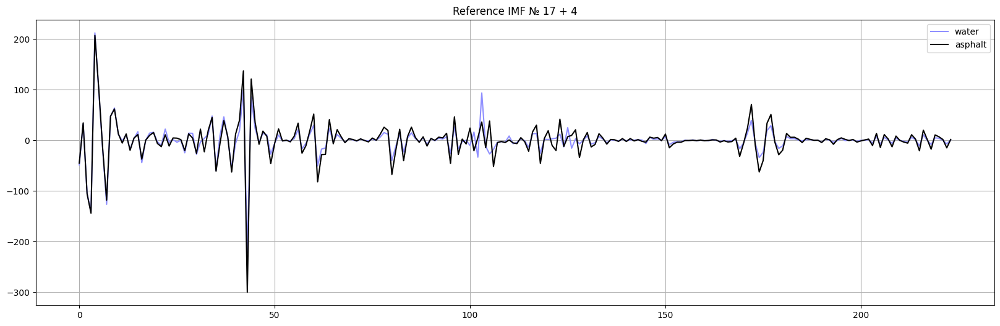

In [8]:
plt.figure(figsize = (20, 6))
plt.title("Reference IMF № 17 + 4")
for j in (0, 8):
    #plt.plot(last_reference_imf[0, j] + first_reference_imf[3, j], color = colors_class[j], label = name_reference[j])
    plt.plot(first_reference_imf[0, j], color = colors_class[j], label = name_reference[j])

plt.legend()
plt.grid()
plt.show()

# Сorrelation analysis

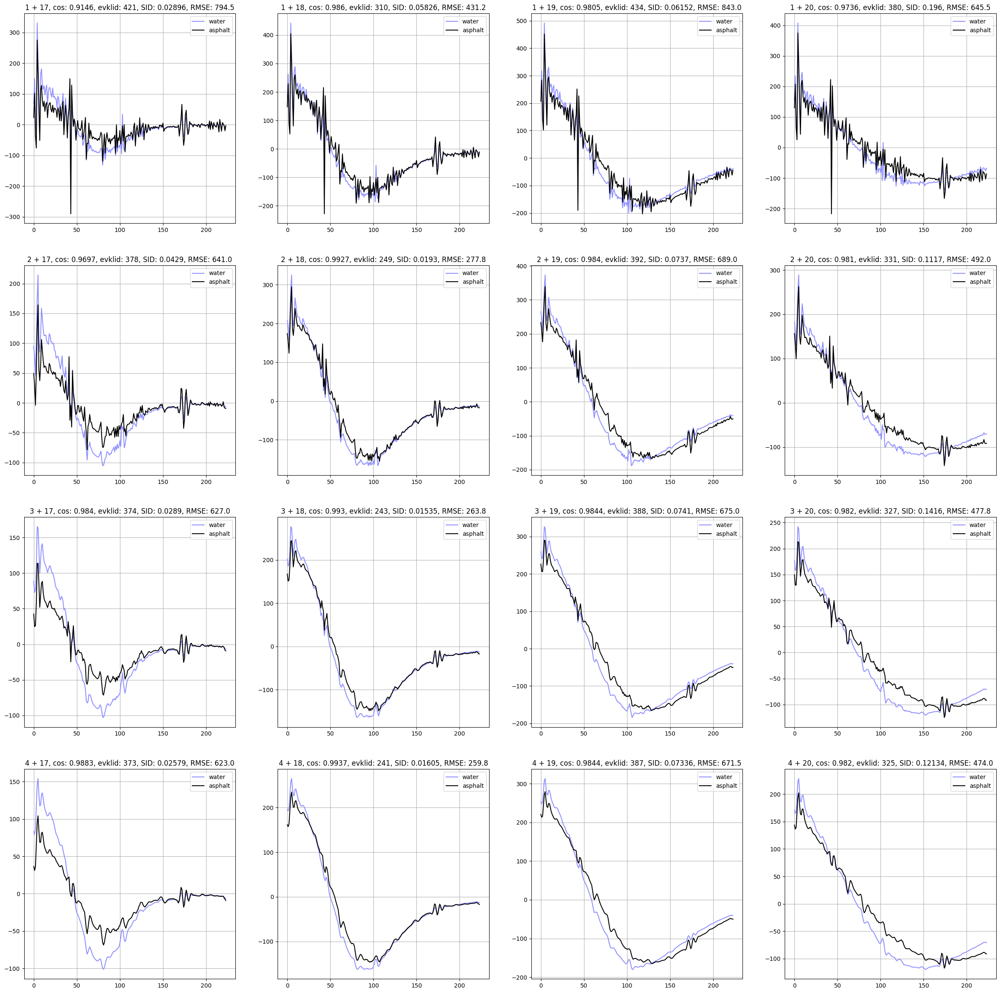

In [193]:
plt.figure(figsize = (30, 30))

for i in range(4):
    for j in range(4):
        plt.subplot(4, 4, i * 4 + j + 1)
        
        water   = first_reference_imf[i, 0] + last_reference_imf[j, 0]
        asphalt = first_reference_imf[i, 8] + last_reference_imf[j, 8]
        
        plt.title(str(i + 1) + " + " + str(j + 17) + ", cos: " + str(np.float16(cos_angle(water, asphalt))) + ", evklid: " + str(int(evklid_dist(water, asphalt))) + ", SID: " + str(np.float16(SID(water, asphalt))) + ", RMSE: " + str(np.float16(RMSE(water, asphalt))))
        
        plt.plot(water, color = colors_class[0], label = name_reference[0])
        plt.plot(asphalt, color = colors_class[8], label = name_reference[8])
        plt.grid()
        plt.legend()
        
plt.show()

(9, 224)


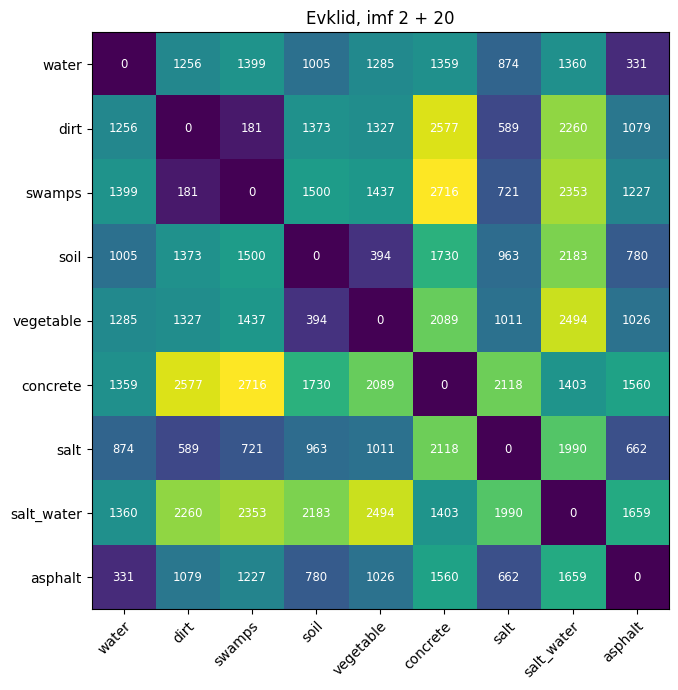

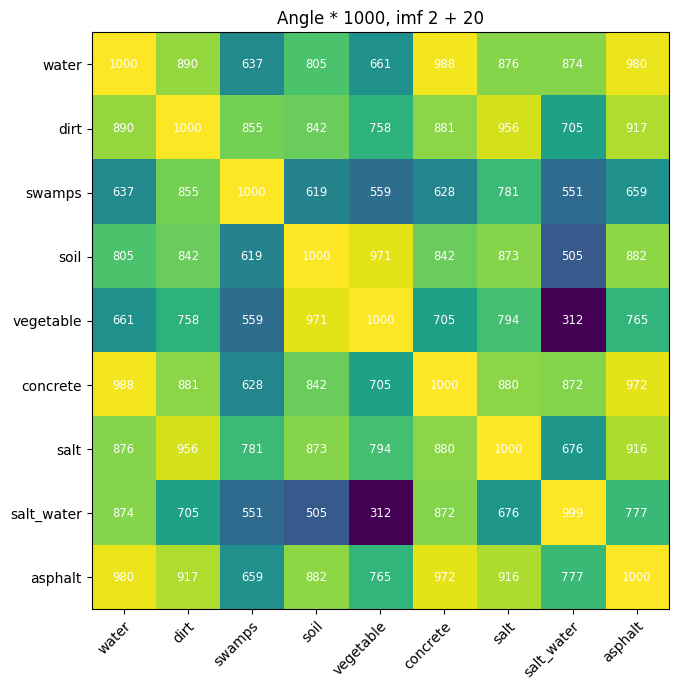

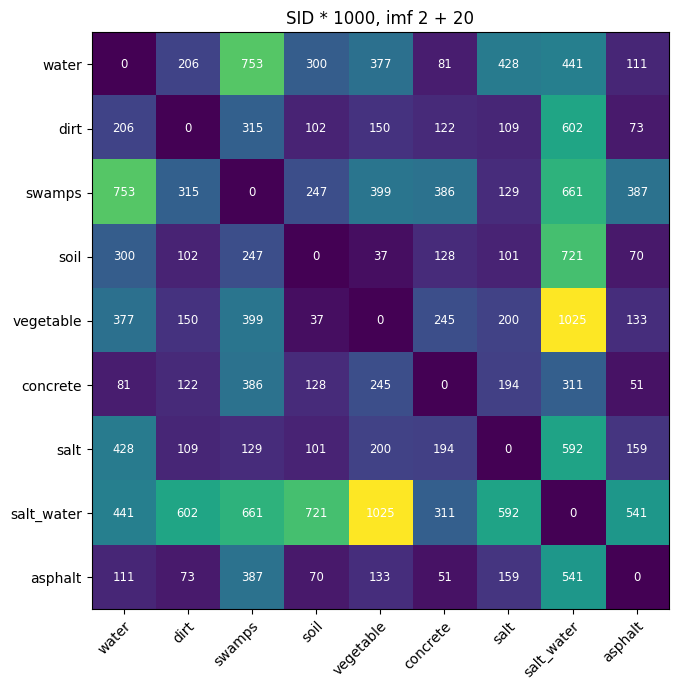

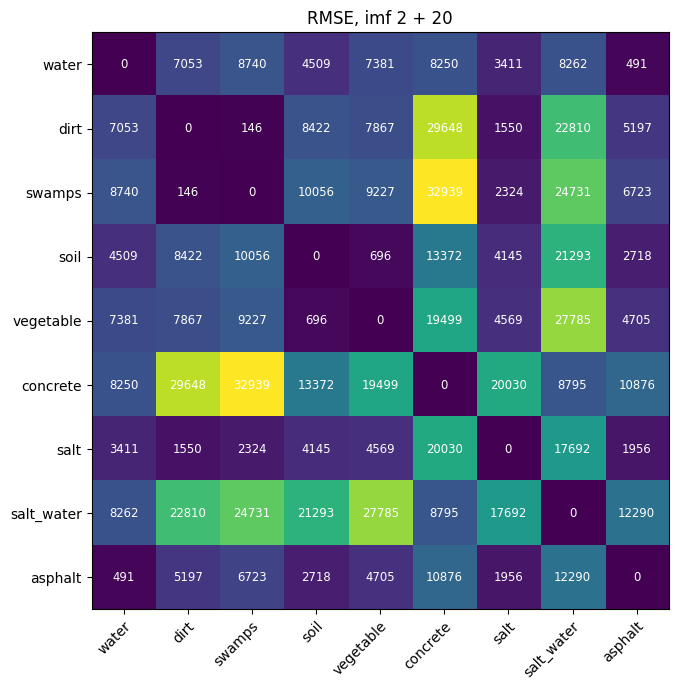

In [222]:
n_first_ref = 1
n_last_ref  = 3

reference_imf = first_reference_imf[n_first_ref] + last_reference_imf[n_last_ref]
print(reference_imf.shape)

evklid_corr_matrix = np.zeros(shape = (reference_imf.shape[0], reference_imf.shape[0]), dtype = float)
angle_corr_matrix = np.zeros(shape = (reference_imf.shape[0], reference_imf.shape[0]), dtype = float)
sid_corr_matrix = np.zeros(shape = (reference_imf.shape[0], reference_imf.shape[0]), dtype = float)
rmse_corr_matrix = np.zeros(shape = (reference_imf.shape[0], reference_imf.shape[0]), dtype = float)

for i in range(reference_imf.shape[0]):
    for j in range(reference_imf.shape[0]):
        evklid_corr_matrix[i, j] = evklid_dist(reference_imf[i], reference_imf[j])
        angle_corr_matrix[i, j] = cos_angle(reference_imf[i], reference_imf[j])
        sid_corr_matrix[i, j] = SID_dist(reference_imf[i], reference_imf[j])
        rmse_corr_matrix[i, j] = RMSE(reference_imf[i], reference_imf[j])

show_corr_matrix(evklid_corr_matrix, name_reference, "Evklid, imf " + str(n_first_ref + 1) + " + " + str(n_last_ref + 17))
show_corr_matrix(angle_corr_matrix * 1000, name_reference, "Angle * 1000, imf " + str(n_first_ref + 1) + " + " + str(n_last_ref + 17))
show_corr_matrix(sid_corr_matrix * 1000, name_reference, "SID * 1000, imf " + str(n_first_ref + 1) + " + " + str(n_last_ref + 17))
show_corr_matrix(rmse_corr_matrix, name_reference, "RMSE, imf " + str(n_first_ref + 1) + " + " + str(n_last_ref + 17))

In [220]:
for n_first_ref in range(4):
    for n_last_ref in range(4):

        reference_imf = first_reference_imf[n_first_ref] + last_reference_imf[n_last_ref]
        
        evklid_corr_matrix = np.zeros(shape = (reference_imf.shape[0], reference_imf.shape[0]), dtype = float)
        angle_corr_matrix = np.zeros(shape = (reference_imf.shape[0], reference_imf.shape[0]), dtype = float)
        sid_corr_matrix = np.zeros(shape = (reference_imf.shape[0], reference_imf.shape[0]), dtype = float)
        rmse_corr_matrix = np.zeros(shape = (reference_imf.shape[0], reference_imf.shape[0]), dtype = float)
        
        for i in range(reference_imf.shape[0]):
            for j in range(reference_imf.shape[0]):
                evklid_corr_matrix[i, j] = evklid_dist(reference_imf[i], reference_imf[j])
                angle_corr_matrix[i, j] = cos_angle(reference_imf[i], reference_imf[j])
                sid_corr_matrix[i, j] = SID_dist(reference_imf[i], reference_imf[j])
                rmse_corr_matrix[i, j] = RMSE(reference_imf[i], reference_imf[j])
                
        evklid_std, evklid_min, evklid_max = stat_from_corr_mat(evklid_corr_matrix)
        angle_std,  angle_min,  angle_max  = stat_from_corr_mat(angle_corr_matrix)
        sid_std,    sid_min,    sid_max    = stat_from_corr_mat(sid_corr_matrix)
        rmse_std,   rmse_min,   rmse_max   = stat_from_corr_mat(rmse_corr_matrix)
        
        print("imf: " + str(n_first_ref + 1) + " + " + str(n_last_ref + 17))
        print("evklid")
        print(evklid_std, "\t", evklid_min, "\t", evklid_max)
        print("angle")
        print(angle_std, "\t", angle_min, "\t", angle_max)
        print("sid")
        print(sid_std, "\t", sid_min, "\t", sid_max)
        print("rmse")
        print(rmse_std, "\t", rmse_min, "\t", rmse_max)
        print()

imf: 1 + 17
evklid
617.5238317559109 	 403.91318992157693 	 2645.0952637670453
angle
0.258664866668725 	 0.029994054204195198 	 0.9608499102272469
sid
0.22234324918897946 	 0.003573724390340073 	 0.6920651278659438
rmse
8800.01855313412 	 728.3297544313565 	 31234.50426072703

imf: 1 + 18
evklid
1316.6869506887147 	 310.8479827098667 	 4761.814239735866
angle
0.26154909714782243 	 0.0754570661969891 	 0.9858731545802026
sid
0.18119254824087233 	 0.0038219528075280037 	 0.6566001873283505
rmse
30622.461448692204 	 431.3681622981857 	 101227.11988281815

imf: 1 + 19
evklid
856.1151780574785 	 434.52328871500475 	 3656.210026779215
angle
0.19875611569626053 	 0.152681364358501 	 0.9803606054830373
sid
0.1684700360964797 	 0.0023449061884634375 	 0.644273115125063
rmse
15640.397709773115 	 842.9039662308187 	 59677.99892821815

imf: 1 + 20
evklid
610.9619529594225 	 295.5468676002358 	 2838.960838498625
angle
0.16183709084025383 	 0.3168109615786751 	 0.9734642176168166
sid
0.2157747479938

In [173]:
def show_corr_matrix(corr_matrix, label_axis, title):    
    fig, ax = plt.subplots(figsize = (7, 7))
    im = ax.imshow(corr_matrix)

    ax.set_xticks(np.arange(len(label_axis)), labels=label_axis)
    ax.set_yticks(np.arange(len(label_axis)), labels=label_axis)

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    
    for i in range(len(label_axis)):
        for j in range(len(label_axis)):
            text = ax.text(j, i, int(corr_matrix[i, j]),
                           ha="center", va="center", color="w", fontsize = "small")
    
    ax.set_title(title)
    fig.tight_layout()
    plt.show()

In [218]:
def stat_on_classes_from_corr_mat(corr_matrix):
    size = corr_matrix.shape
    
    
            
    return np.std(data_for_std), np.min(data_for_std), np.max(data_for_std)

--------------------

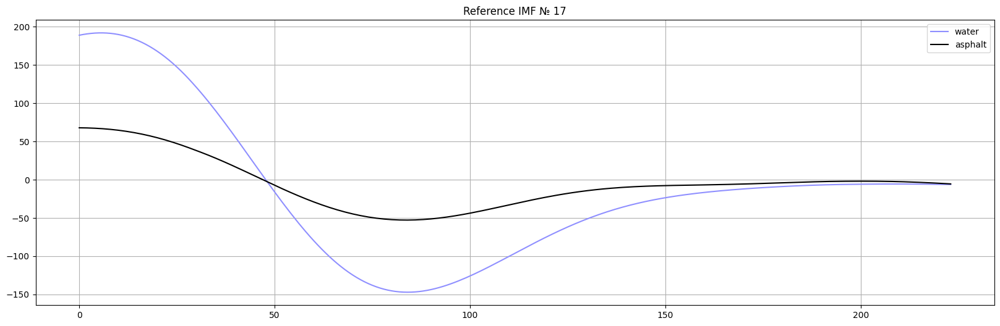

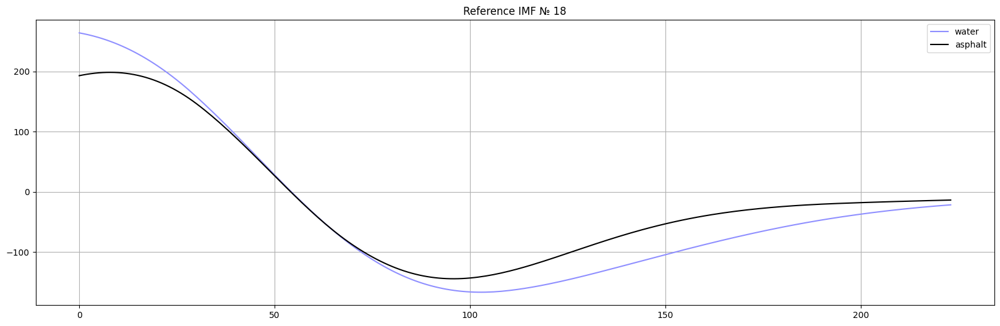

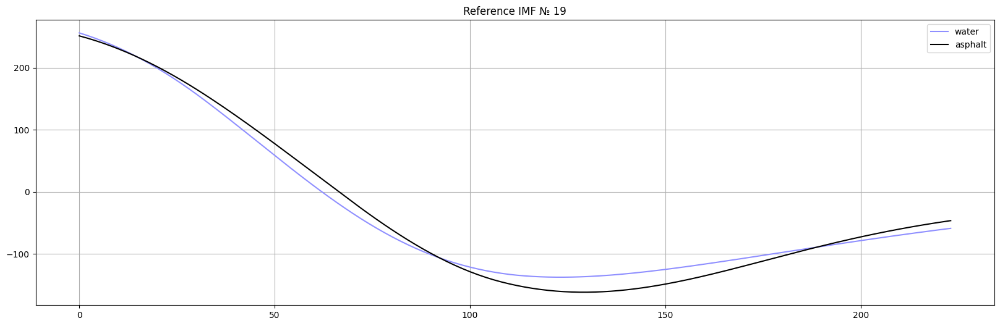

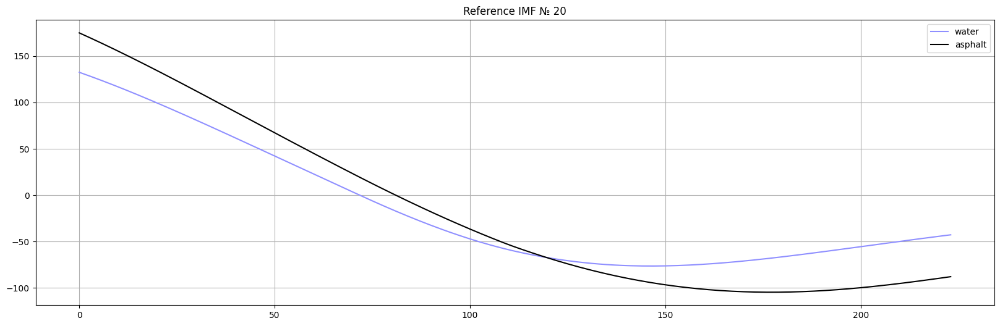

In [11]:
for i in range(4):
    plt.figure(figsize = (20, 6))
    plt.title("Reference IMF № " + str(i + 17))
    for j in (0, 8): #range(reference_imfs.shape[1]):
        plt.plot(last_reference_imf[i, j], color = colors_class[j], label = name_reference[j])
        #plt.plot(last_reference_imf[i, j] + first_reference_imf[3, j], color = colors_class[j], label = name_reference[j])
        #plt.plot(last_reference_imf[i, j] + last_reference_imf[i - 1, j], color = colors_class[j], label = name_reference[j])
    plt.legend()
    plt.grid()
    plt.show()

In [9]:
sum_imf = first_imfs[3] + last_imfs[0]
sum_reference_imfs = first_reference_imf[3] + last_reference_imf[0]
print("sum_imf.shape", sum_imf.shape)
print("sum_reference_imfs.shape", sum_reference_imfs.shape)

sum_imf.shape (753, 1924, 224)
sum_reference_imfs.shape (9, 224)


In [14]:
centers, kmean_labels = clear_KMeans(imfs = sum_imf, HSI = HSI, reference = sum_reference_imfs, max_iters = 150)

init centroids


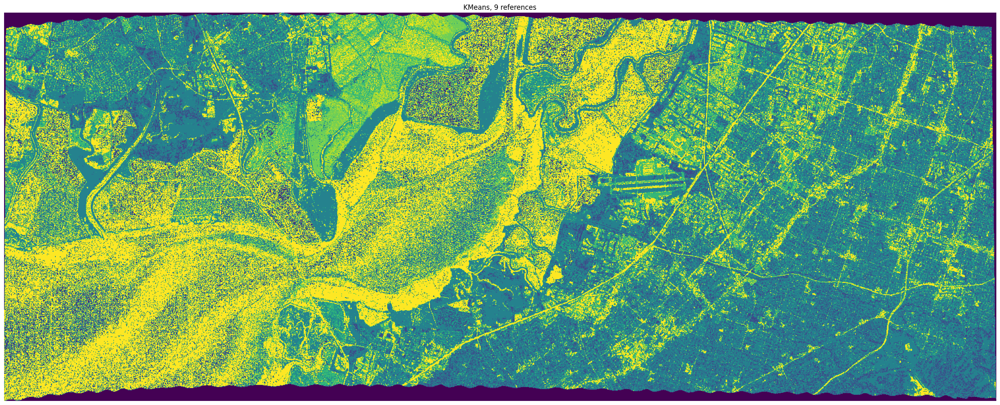

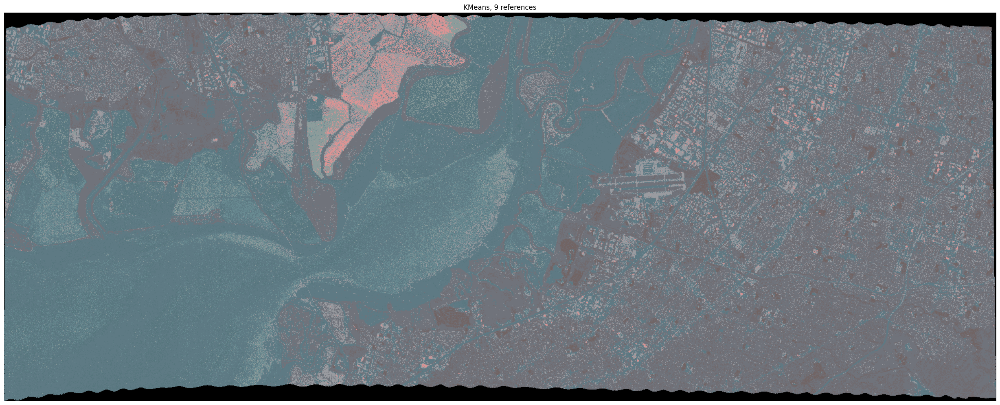

In [16]:
#title = "Label map, KMeans, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf + 1)
#title = "***"
title = "KMeans, 9 references"

plt.figure(figsize = (25, 10))
plt.imshow(kmean_labels)
plt.axis("off")
plt.title(title)
plt.tight_layout()
plt.show()
#plt.savefig("./image-data/emd-2-ref/angle-KMeans-with-initial-references/labals-map/" + title + ".png")
#plt.close()

kmean_color_label = hl.RGB_labels(color_image, kmean_labels)
#title = "Color map, KMeans, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf + 1)
#title = "***"

plt.figure(figsize = (25, 10))
plt.imshow(kmean_color_label)
plt.axis("off")
plt.title(title)
plt.tight_layout()
plt.show()
#plt.savefig("./image-data/emd-2-ref/angle-KMeans-with-initial-references/colors-map/" + title + ".png")
#plt.close()

In [171]:
def SID_dist(s1, s2):
    #s1 -= s1.min() - 1
    #s2 -= s2.min() - 1
    
    s1 = s1 - s1.min() + 1
    s2 = s2 - s2.min() + 1
    
    p = s1 / np.sum(s1) #np.linalg.norm(s1)
    q = s2 / np.sum(s2) #np.linalg.norm(s2)
    
    return np.sum((p - q) * (np.log(p) - np.log(q)))

def evklid_dist(vector1, vector2):
    return np.linalg.norm(vector1 - vector2)

def cos_angle(vector1, vector2):
    unit_vector1 = vector1 / np.linalg.norm(vector1)
    unit_vector2 = vector2 / np.linalg.norm(vector2)

    return np.dot(unit_vector1, unit_vector2)

def mul_cos_angles(vector1, vector2):
    unit_vector1 = vector1.transpose() / np.linalg.norm(vector1, axis = 1)
    unit_vector2 = vector2.transpose() / np.linalg.norm(vector2, axis = 1)
    
    unit_vector1 = unit_vector1.transpose()
    unit_vector2 = unit_vector2.transpose()
    
    angles = np.zeros(shape = (unit_vector1.shape[0], unit_vector2.shape[0]))
    for i in range(unit_vector2.shape[0]):
        angles[:, i] = unit_vector1.dot(unit_vector2[i])
        
    return angles



def clear_KMeans(imfs, HSI, number_of_clusters = 4, reference = None, max_iters = 50):
    
    HSI = np.reshape(HSI, (HSI.shape[0] * HSI.shape[1], HSI.shape[2]))
    
    height, width, bands = imfs.shape
    imfs = np.reshape(imfs, (height * width, bands))
    
    mask = np.arange(0, imfs.shape[0], dtype = int)
    bool_mask = np.all(HSI == -50, axis = 1)
    mask[bool_mask] = -1
    
    clear_imfs = imfs[mask != -1]
    clear_mask = mask[mask != -1]
    
    if reference is None:
        print("random centroids")
        kmeans = KMeans(n_clusters = number_of_clusters, random_state = 0, n_init = "auto").fit(clear_imfs)
    else:
        print("init centroids")
        kmeans = KMeans(n_clusters = reference.shape[0], init = reference, n_init = "auto").fit(clear_imfs)
    centers = kmeans.cluster_centers_
    clear_labels = kmeans.labels_
    
    #centers, clear_labels = do_kmeans(X = clear_imfs, K = reference.shape[0], init = reference, max_iters = max_iters)

    labels = np.zeros(shape = height * width, dtype = int)
    
    for i in range(clear_mask.shape[0]):
        labels[clear_mask[i]] = clear_labels[i] + 1
    
    labels = np.reshape(labels, (height, width))
    
    return centers, labels



def do_kmeans(X, K, init = None, max_iters = 50):
    np.random.seed(42)
    
    # Инициализация центроидов
    
    if init is None:
        print("random centroids")
        centroids = X[np.random.choice(range(len(X)), size = K, replace=False)]
    else:
        print("init centroids")
        centroids = init
    
    for i in range(max_iters):
        # Расчет расстояний между точками и центроидами
        #distances = np.linalg.norm(X[:, np.newaxis] - centroids, axis = 2)
        distances = mul_cos_angles(X, centroids)
        
        # Определение ближайшего центроида для каждой точки
        #labels = np.argmin(distances, axis=1)
        labels = np.argmax(distances, axis=1)
        
        # Обновление центроидов на основе средних значений в каждом кластере
        new_centroids = np.array([X[labels==k].mean(axis=0) for k in range(K)])
        #print(new_centroids)
        
        # Проверка условия сходимости
        if np.all(centroids == new_centroids):
            break
        
        centroids = new_centroids
        
        # Напечатать номер завершённой итерации
        print('\r', end = '')
        print("Итерация № " + str(i + 1), end = '')
        
    print(". Завершено")
        
    return centroids, labels

In [7]:
first_IMFs = np.zeros(shape = (6, height, width, bands), dtype = float)
last_IMFs = np.zeros(shape = (4, height, width, bands), dtype = float)

for i in range(height):
    for j in range(width):
        
        if np.all(HSI[i, j] == - 50):
            continue
            
        imf = do_EMD(np.float64(HSI[i, j]))
        
        first_IMFs[:, i, j, :] = imf[:6]
        last_IMFs[:, i, j, :] = imf[-4:]
    
    print('\r', end = '')
    print(i, end = '')
    
    #pix = (i * width) + height
    #if pix % 100 == 0:
    #    print('\r', end = '')
    #    print("обработано " + str(pix) + " пикселей из " +
    #    str(width * height), end = '')

752

In [47]:
last_reference_imf.shape

(4, 9, 224)

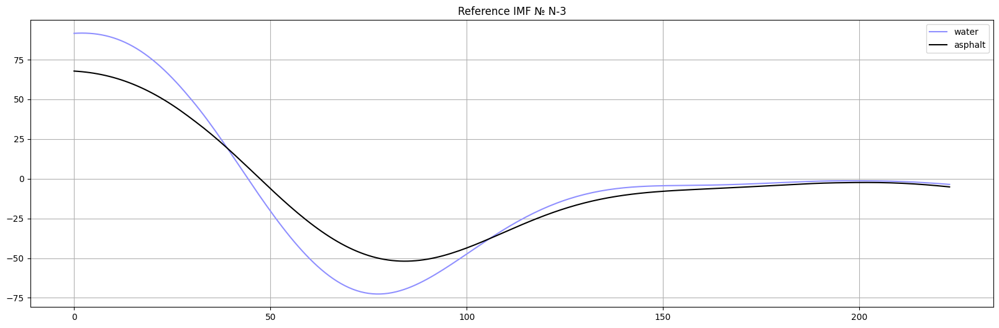

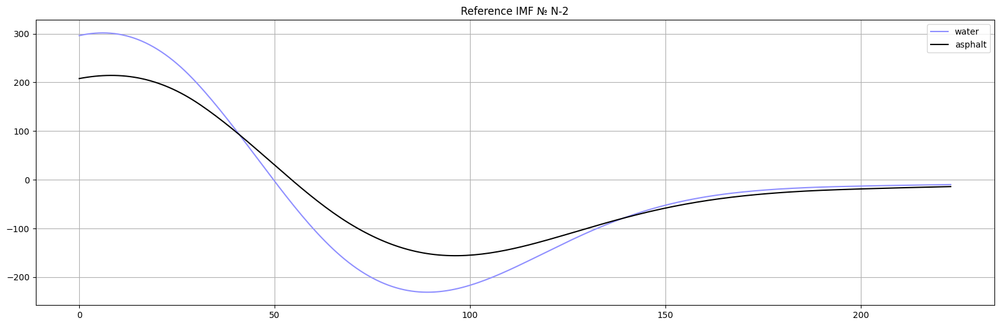

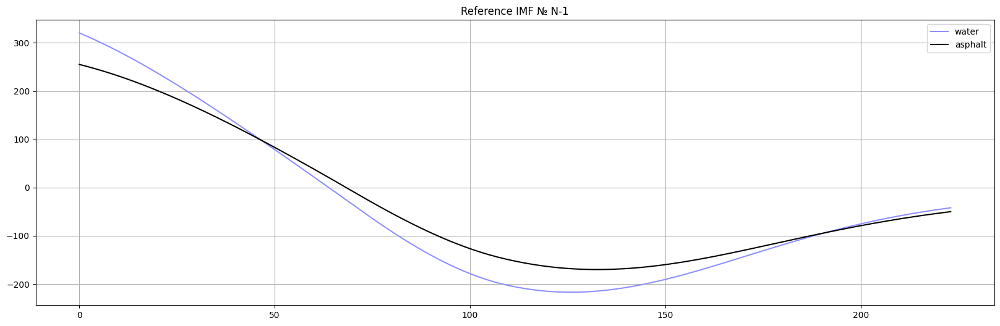

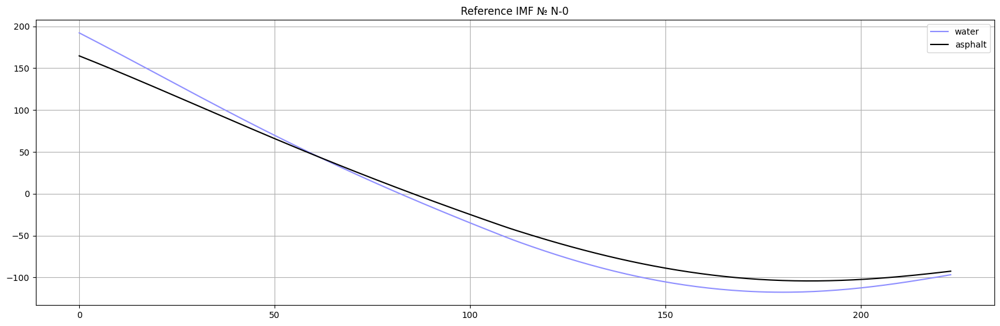

In [60]:
for i in range(4):
    plt.figure(figsize = (20, 6))
    plt.title("Reference IMF № N-" + str(3 - i))
    for j in (0, 8): #range(reference_imfs.shape[1]):
        plt.plot(last_reference_imf[i, j], color = colors_class[j], label = name_reference[j])
        #plt.plot(last_reference_imf[i, j] + first_reference_imf[3, j], color = colors_class[j], label = name_reference[j])
        #plt.plot(last_reference_imf[i, j] + last_reference_imf[i - 1, j], color = colors_class[j], label = name_reference[j])
    plt.legend()
    plt.grid()
    plt.show()

In [14]:
#np.save("last4imfs.moffetfield.win(3)", last_IMFs)

In [15]:
#np.save("first6imfs.moffetfield.win(3)", first_IMFs)